# Reading a Buffer

This jupyter notebook reads a buffer an plots all it's attributes over the event numbers. You can use whichever buffer you want by simply selecting a data file and tweaking the appropriate parameters on the setup block below

In [1]:
# import necessary modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import to_hex
from matplotlib.ticker import AutoMinorLocator
import numpy as np
import os

# Import our raad library
# import sys
# sys.path.append('../../')
import raadpy as  rp

# Define some constants
raw_dir = '../../Data/RAW/'

# Print the tree of the raw data directory
for root, dirs, files in os.walk(raw_dir):
    level = root.replace(raw_dir, '').count(os.sep)
    indent = ' ' * 4 * (level)
    print('{}{}/'.format(indent, os.path.basename(root)))
    subindent = ' ' * 4 * (level + 1)
    for f in files:
        print('{}{}'.format(subindent, f))

ModuleNotFoundError: No module named 'core'

# Orbit Buffer Data

First we collect the data from the orbit buffer, then we split based on the detector id and then plot

In [2]:
# Directory of the buffer
buffer_fname    = raw_dir + 'SD-915/' + 'Light1_2022-05-20_Buff1.dat'

# Decode the buffer data in a dictionary
data_SiPM   = rp.get_dict(buffer_fname,struct=rp.ORBIT_STRUCT,condition="data['id_bit'] == 0")
data_PMT    = rp.get_dict(buffer_fname,struct=rp.ORBIT_STRUCT,condition="data['id_bit'] == 1")

Line:   0%|          | 0/4347 [00:00<?, ?it/s]

Line:   0%|          | 0/4347 [00:00<?, ?it/s]

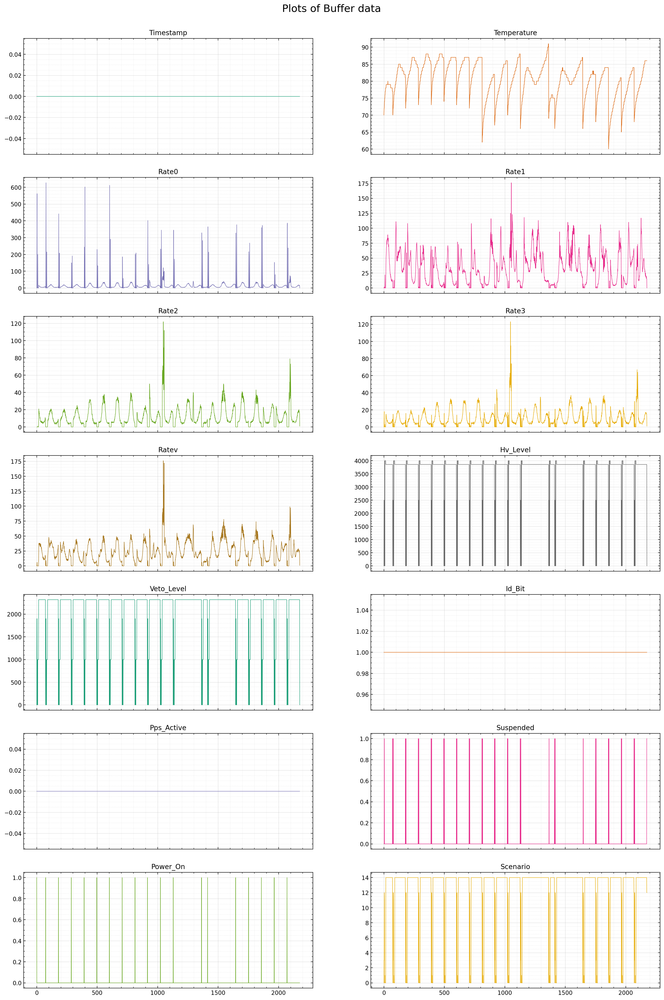

In [3]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_PMT)
fig

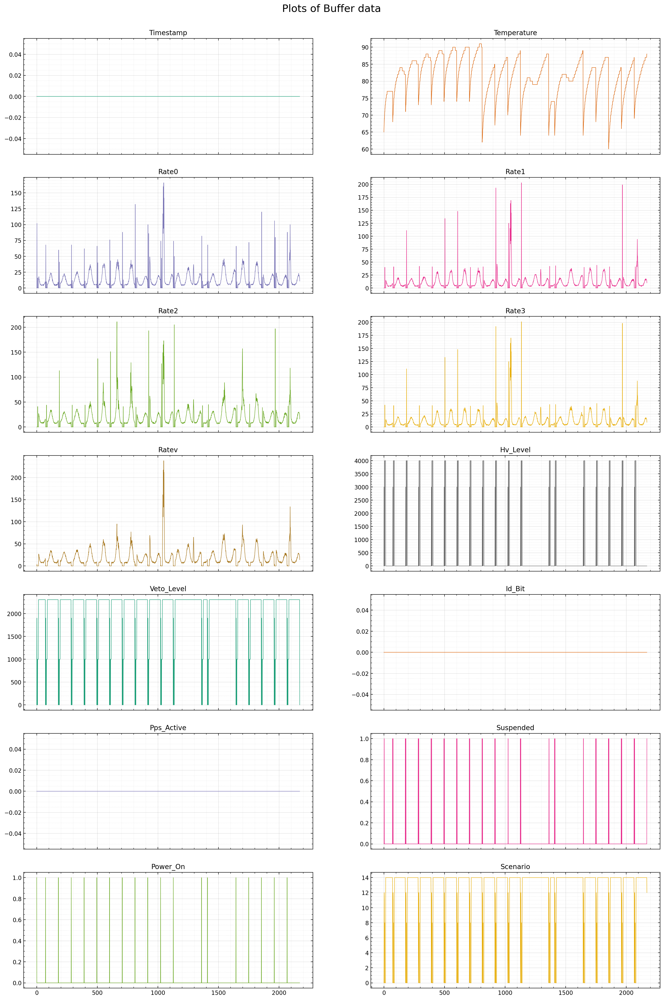

In [4]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM)
fig

# Veto Buffer Data

We collect both the PMT and SiPM data from the Veto buffers and then plot

In [5]:
# Directory of the buffer
buffer_fname    = raw_dir + 'SD-915/' + 'Light1_2022-05-20_Buff6.dat'

# Decode the buffer data in a dictionary
data_SiPM_v     = rp.get_dict(buffer_fname,struct=rp.VETO_STRUCT,MAX=100000)

# Directory of the buffer
buffer_fname    = raw_dir + 'SD-915/' + 'Light1_2022-05-20_Buff7.dat'

# Decode the buffer data in a dictionary
data_PMT_v      = rp.get_dict(buffer_fname,struct=rp.VETO_STRUCT,MAX=100000)

Line:   0%|          | 0/100000 [00:00<?, ?it/s]

Line:   0%|          | 0/100000 [00:00<?, ?it/s]

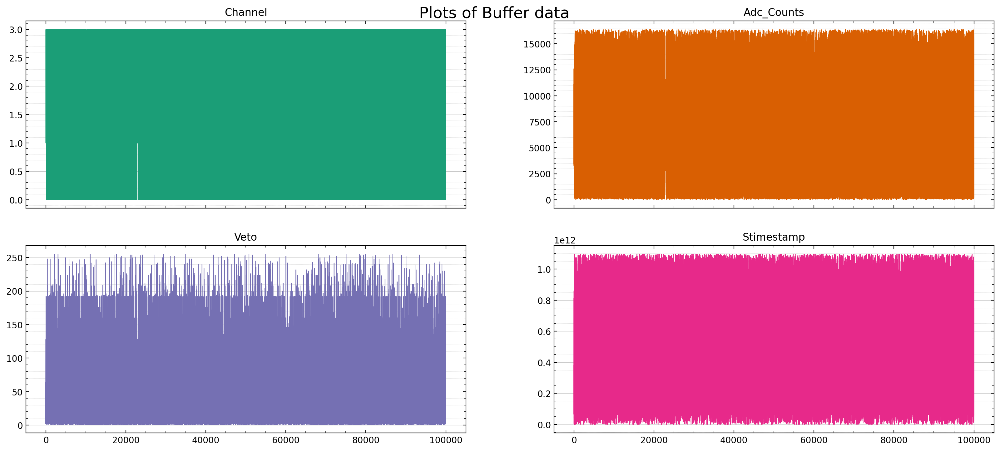

In [6]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM_v)
fig

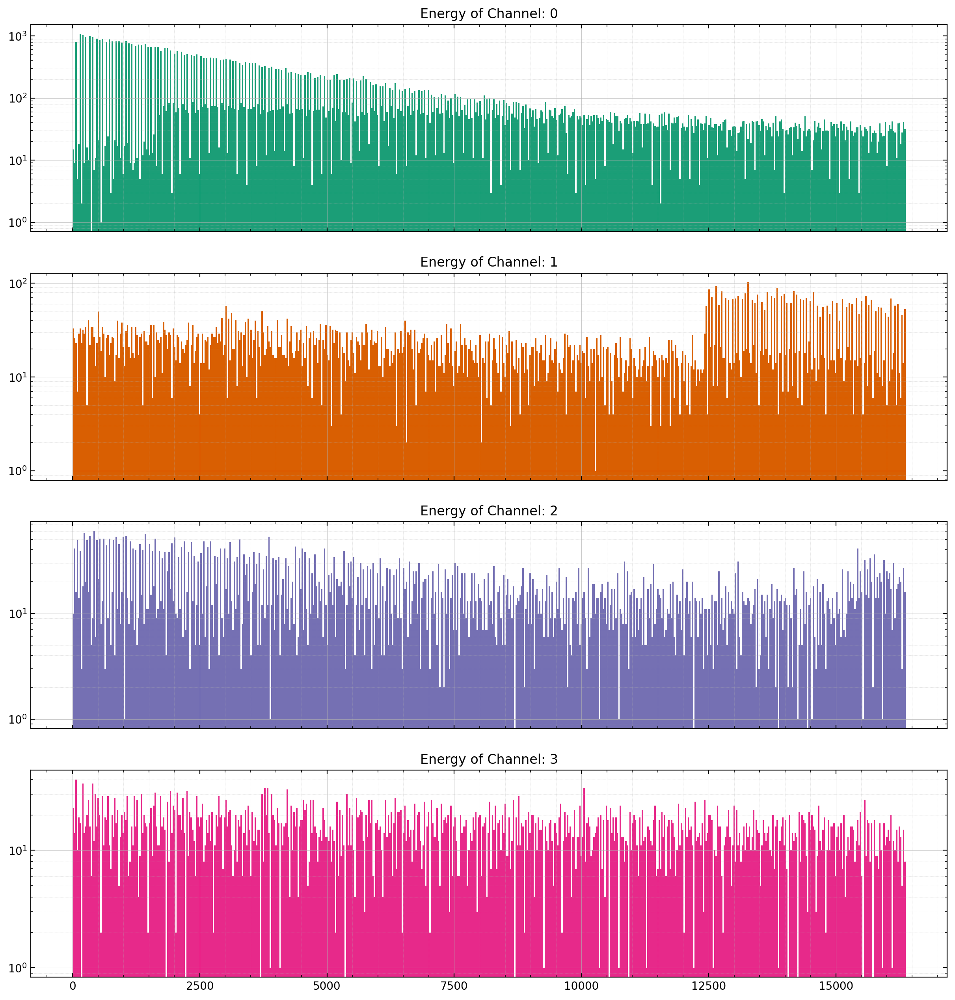

In [7]:
# Plot histograms
fig,ax = rp.plot_hists(data_SiPM_v,struct=rp.VETO_STRUCT)
fig

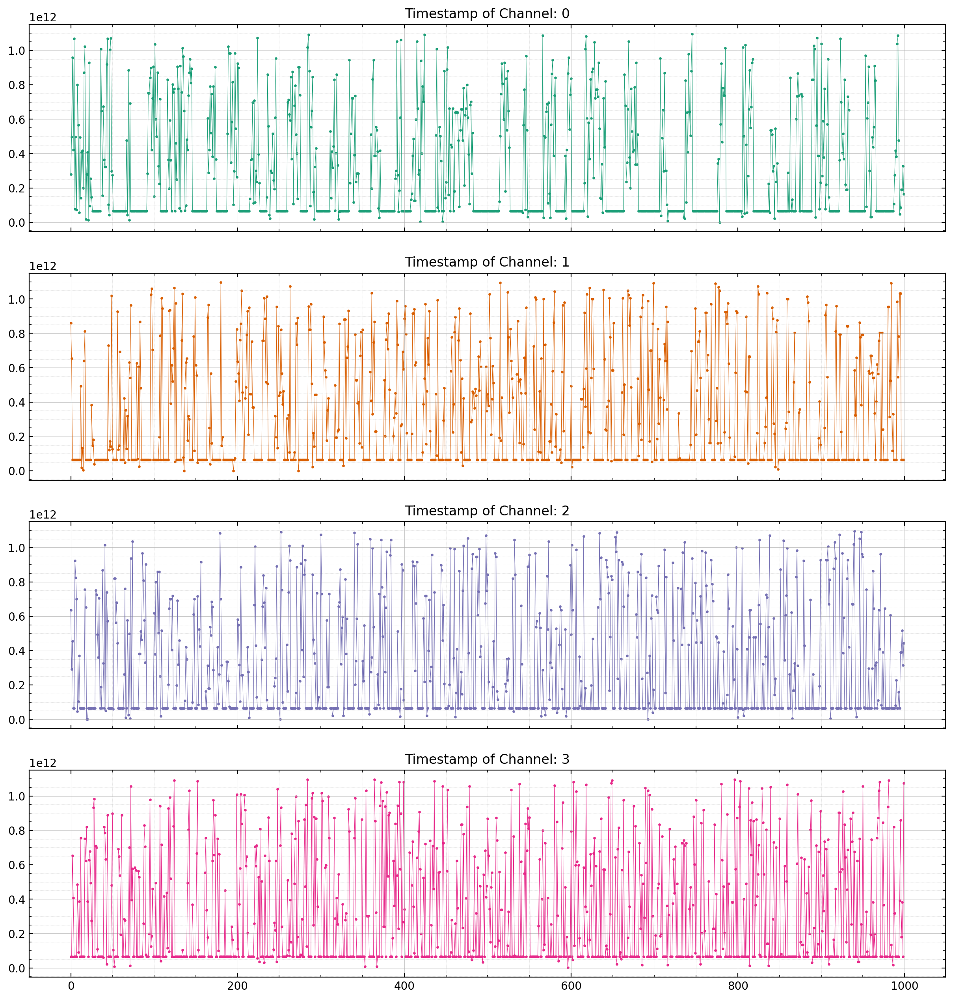

In [20]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_SiPM_v,RANGE=(0,1000),struct=rp.VETO_STRUCT)
fig

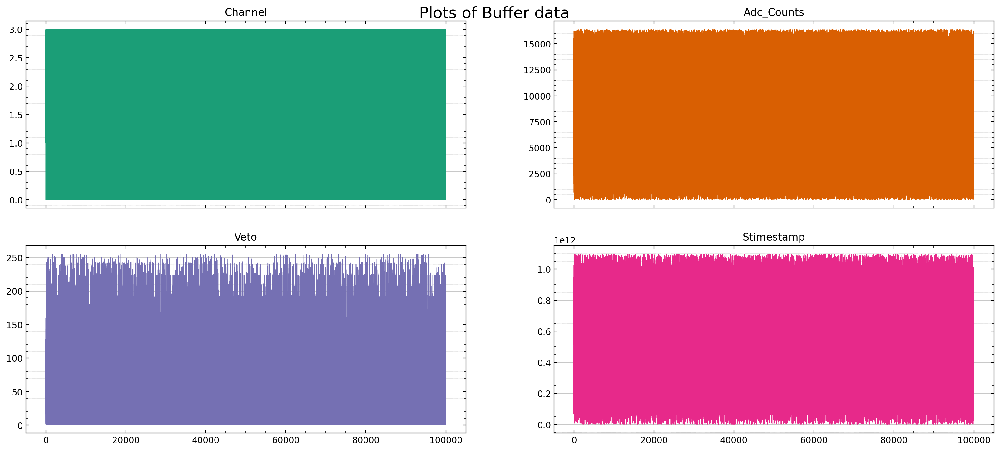

In [9]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_PMT_v)
fig

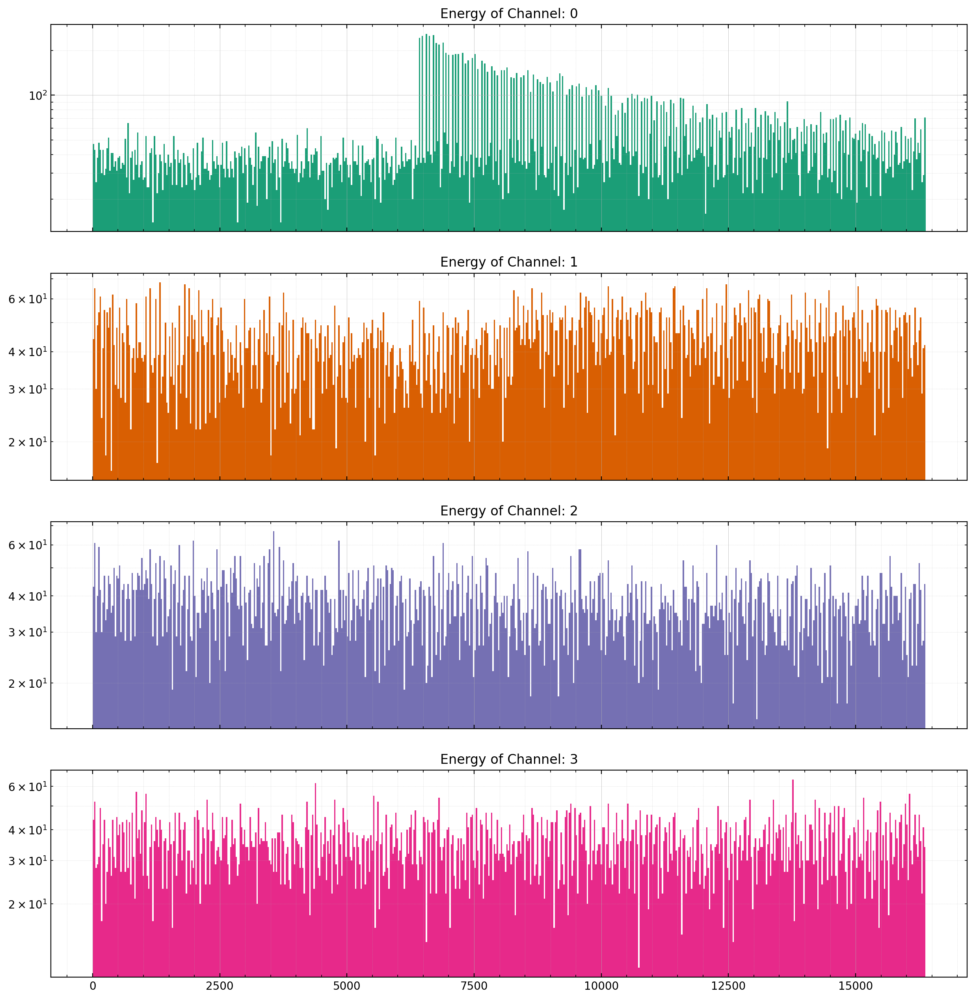

In [10]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_v,struct=rp.VETO_STRUCT)
fig

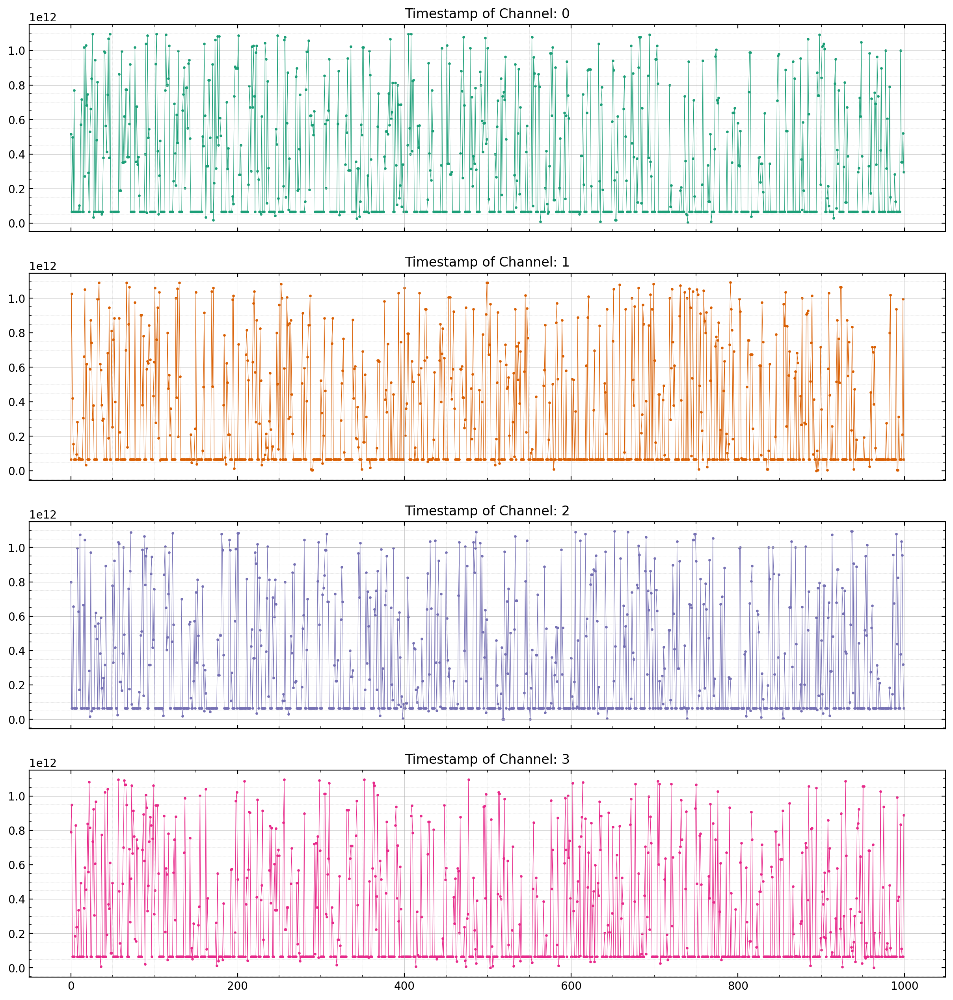

In [11]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_PMT_v,RANGE=(0,1000),struct=rp.VETO_STRUCT)
fig

# Non Veto Buffer Data

We collect both the PMT and SiPM data from the NON Veto buffers and then plot

In [12]:
# Directory of the buffer
buffer_fname    = raw_dir + 'SD-915/' + 'Light1_2022-05-20_Buff4.dat'

# Decode the buffer data in a dictionary
data_SiPM_nv    = rp.get_dict(buffer_fname,struct=rp.NONVETO_STRUCT,MAX=100000)

# Directory of the buffer
buffer_fname    = raw_dir + 'SD-915/' + 'Light1_2022-05-20_Buff5.dat'

# Decode the buffer data in a dictionary
data_PMT_nv     = rp.get_dict(buffer_fname,struct=rp.NONVETO_STRUCT,MAX=100000)

Line:   0%|          | 0/100000 [00:00<?, ?it/s]

Line:   0%|          | 0/100000 [00:00<?, ?it/s]

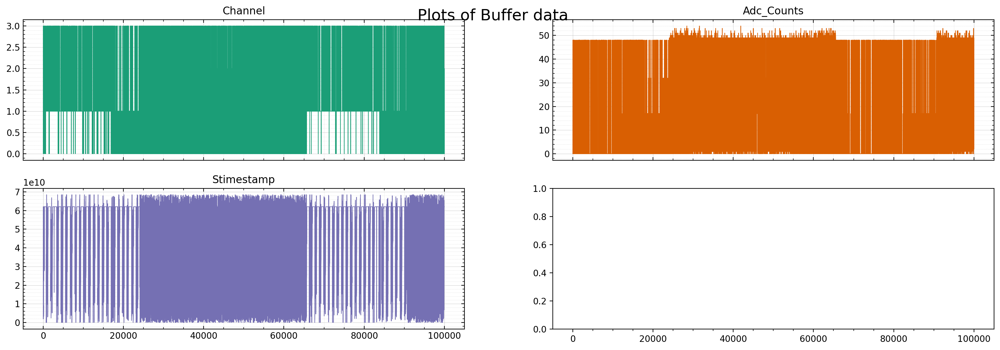

In [13]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM_nv)
fig

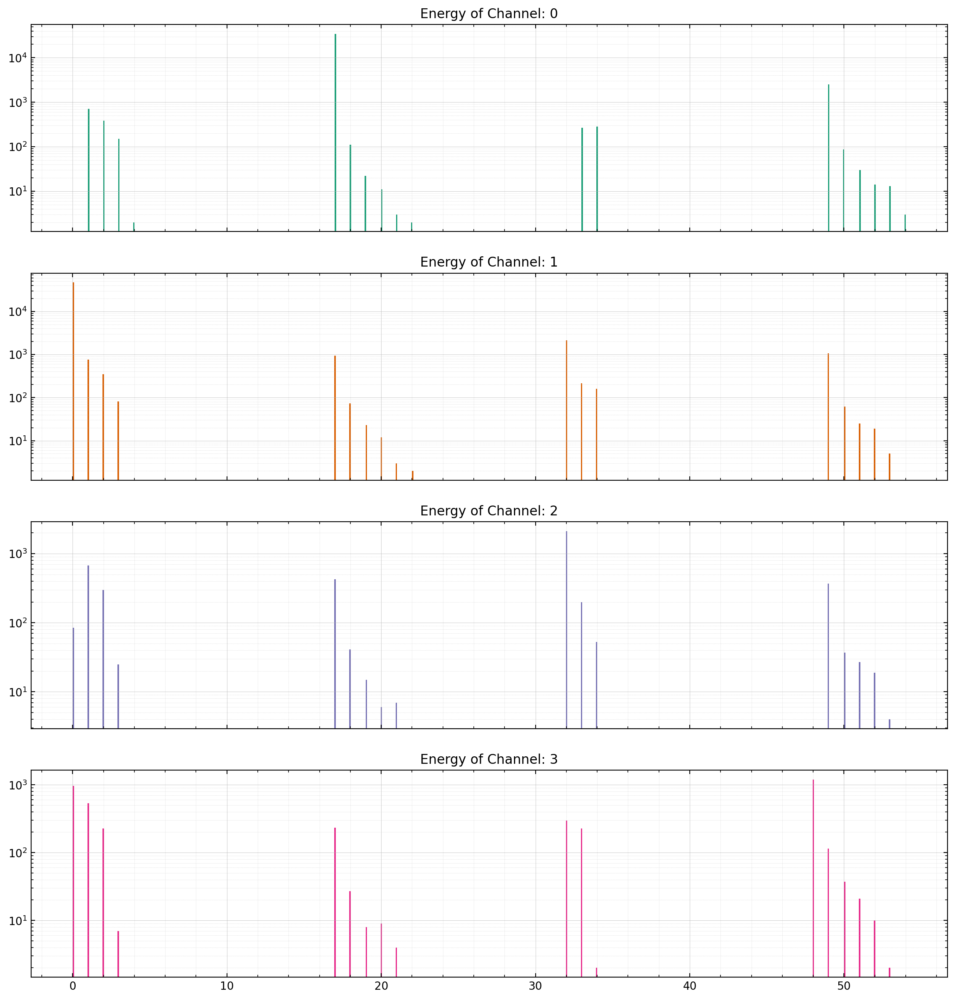

In [14]:
# Plot histograms
fig,ax = rp.plot_hists(data_SiPM_nv,struct=rp.NONVETO_STRUCT)
fig

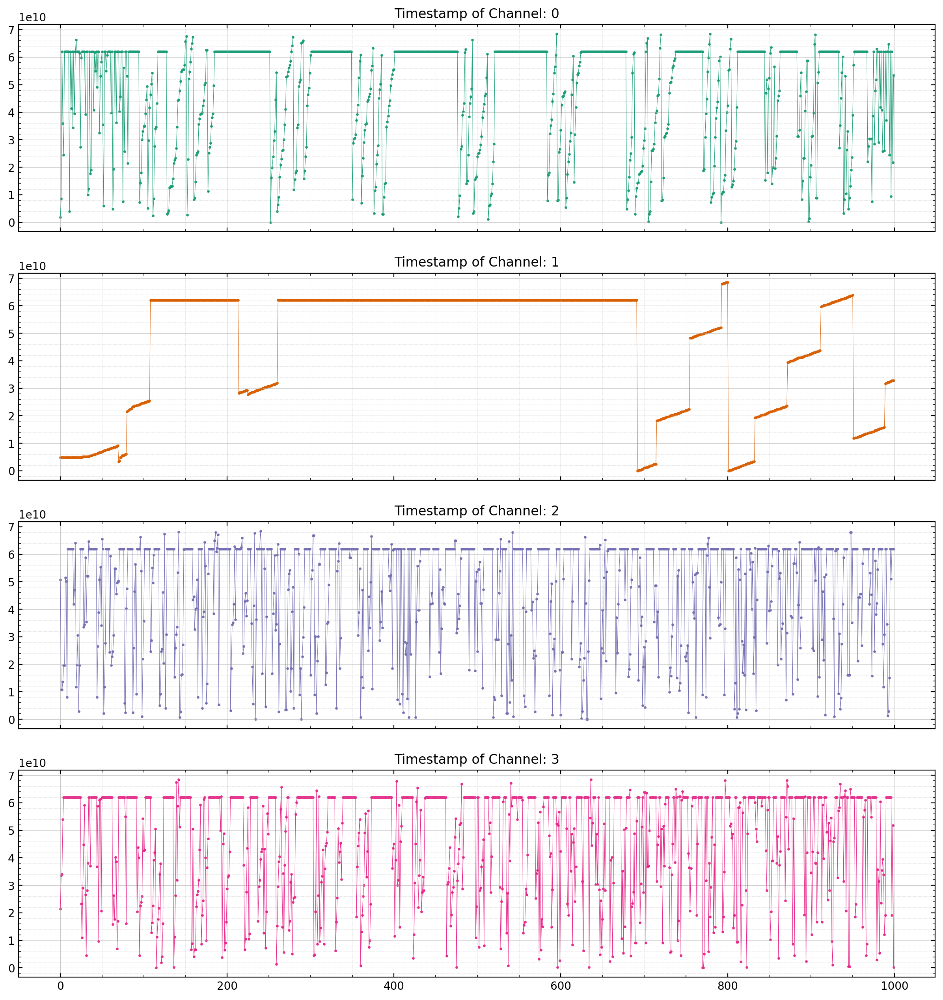

In [15]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_SiPM_nv,RANGE=(0,1000),struct=rp.NONVETO_STRUCT)
fig

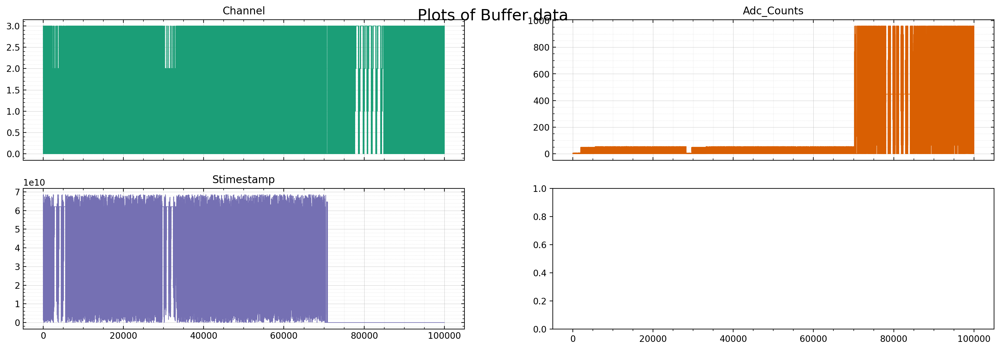

In [16]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_PMT_nv)
fig

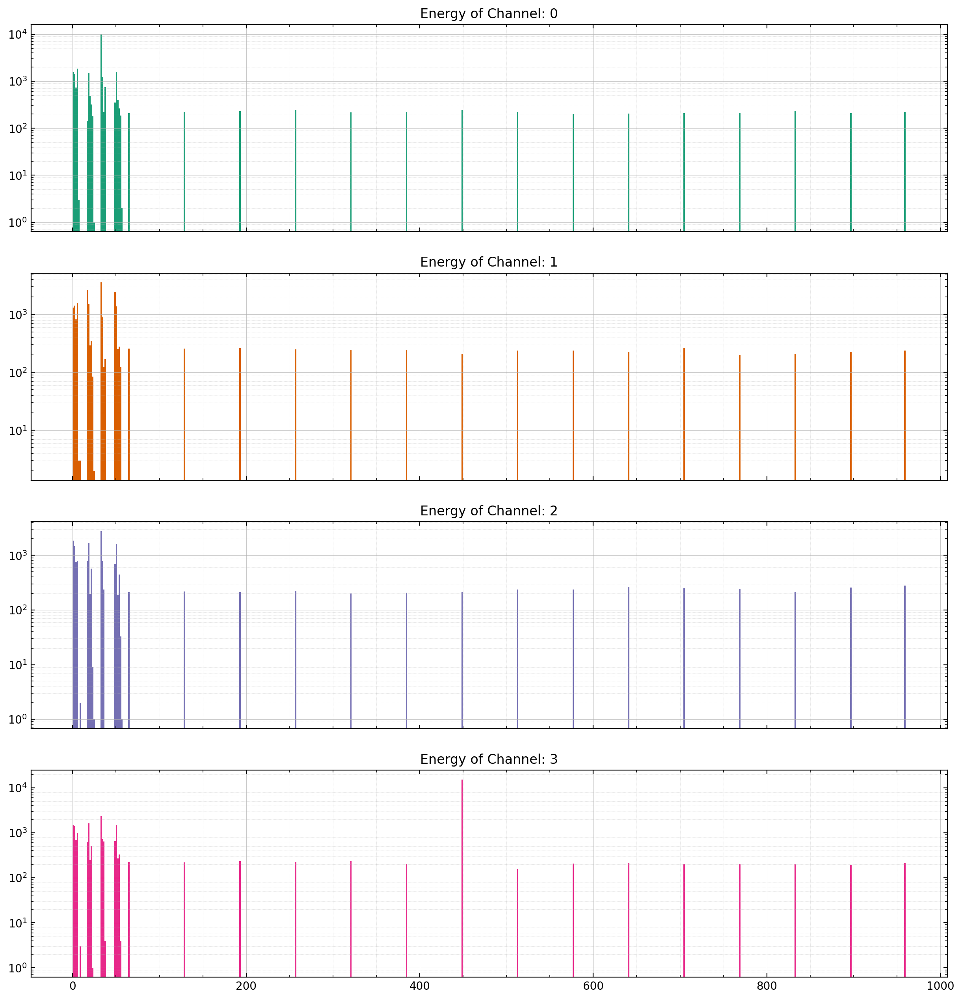

In [17]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_nv,struct=rp.NONVETO_STRUCT)
fig

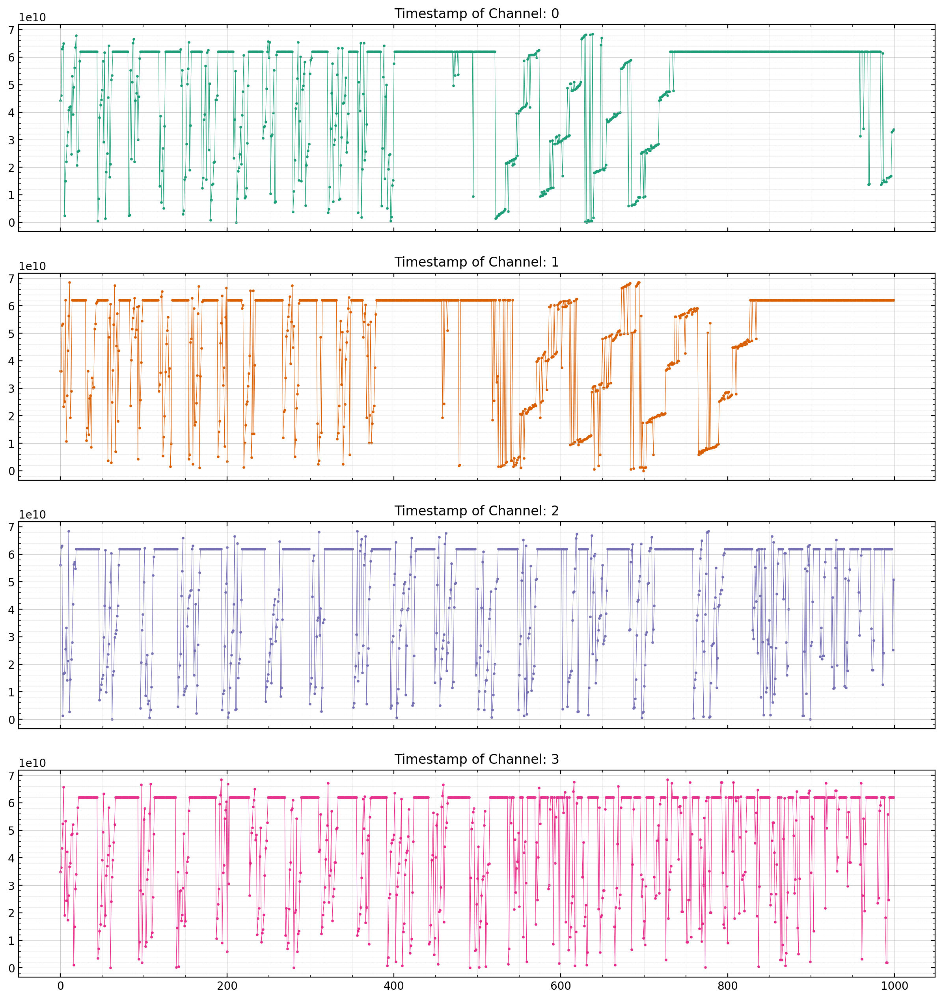

In [18]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_PMT_nv,RANGE=(0,1000),struct=rp.NONVETO_STRUCT)
fig

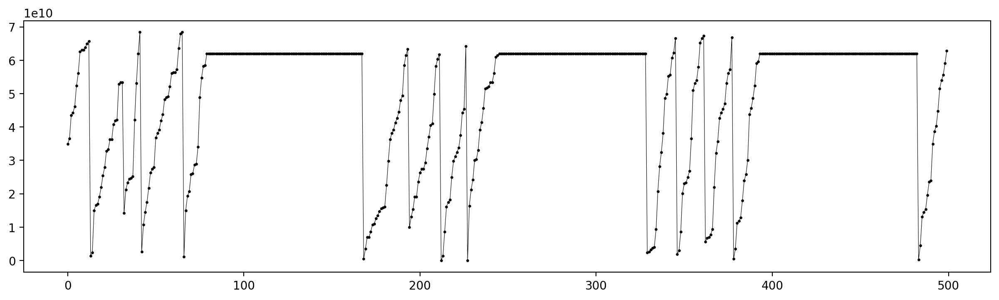

In [19]:
fig = plt.figure(figsize=(15,4),dpi=200)
ax = fig.add_subplot(111)
N = 500
ax.scatter(range(N),data_PMT_nv['stimestamp'][:N],s=2,marker='o',c='k')
ax.plot(range(N),data_PMT_nv['stimestamp'][:N],lw=0.4,c='k')
fig